<a href="https://colab.research.google.com/github/karimfathy054/Flickr8k-Image-Captioning/blob/main/Image_captioning_model_CNN%2BLSTM(pre_injection_model).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Model,save_model,load_model
from keras.layers import *
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.applications.resnet50 import ResNet50,preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping , Callback
from tqdm.notebook import tqdm
import pickle
import os
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.bleu_score import SmoothingFunction


In [2]:
!kaggle datasets download -d adityajn105/flickr8k

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
 98% 1.02G/1.04G [00:08<00:00, 176MB/s]
100% 1.04G/1.04G [00:08<00:00, 136MB/s]


In [ ]:
!unzip flickr8k.zip

In [17]:
img_features = pickle.load(open("/content/drive/MyDrive/image feature/features (1).pkl","rb"))

In [5]:
dataset = pd.read_csv('/content/captions.txt')

In [6]:
def text_preprocess(dataset):
  dataset["caption"] = dataset["caption"].apply(lambda x:x.lower())
  dataset["caption"] = dataset["caption"].apply(lambda x:x.replace("[^A-Za-z]",""))
  dataset["caption"] = dataset["caption"].apply(lambda x:x.replace("\s+"," "))
  dataset["caption"] = dataset["caption"].apply(lambda x:" ".join(word for word in x.split() if len(word)>1))
  dataset["caption"] = "ssttaarrtt " + dataset["caption"] + " eenndd"
  return dataset
text_preprocess(dataset)

,image,caption
0,1000268201_693b08cb0e.jpg,ssttaarrtt child in pink dress is climbing up ...
1,1000268201_693b08cb0e.jpg,ssttaarrtt girl going into wooden building eenndd
2,1000268201_693b08cb0e.jpg,ssttaarrtt little girl climbing into wooden pl...
3,1000268201_693b08cb0e.jpg,ssttaarrtt little girl climbing the stairs to ...
4,1000268201_693b08cb0e.jpg,ssttaarrtt little girl in pink dress going int...
...,...,...
40450,997722733_0cb5439472.jpg,ssttaarrtt man in pink shirt climbs rock face ...
40451,997722733_0cb5439472.jpg,ssttaarrtt man is rock climbing high in the ai...
40452,997722733_0cb5439472.jpg,ssttaarrtt person in red shirt climbing up roc...
40453,997722733_0cb5439472.jpg,ssttaarrtt rock climber in red shirt eenndd


In [7]:
images = dataset["image"].unique().tolist()
images_number = len(images)

images_training_set = images[:6000]
images_validation_set = images[6000:7000]
images_test_set = images[7000:8000]

training_set = dataset[dataset["image"].isin(images_training_set)]
validation_set = dataset[dataset["image"].isin(images_validation_set)]
test_set = dataset[dataset["image"].isin(images_test_set)]

training_set.reset_index(drop=True,inplace=True)
validation_set.reset_index(drop=True,inplace=True)
test_set.reset_index(drop=True,inplace=True)

In [8]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(training_set["caption"].tolist())
vocab_size = len(tokenizer.word_index) + 1
max_sentence_len = max([len(s.split()) for s in training_set["caption"].tolist()])

print(f"""
vocab size = {vocab_size}
max sentence length = {max_sentence_len}
images number = {images_number}
""")


vocab size = 7456
max sentence length = 34
images number = 8091



In [9]:
train_ref={}
for image in tqdm(training_set["image"].unique().tolist()):
  references = training_set.loc[training_set["image"]==image]
  references = references["caption"]
  references = [x.split() for x in references]
  train_ref[image] = references

  0%|          | 0/6000 [00:00<?, ?it/s]

In [10]:
validate_ref={}
for image in tqdm(validation_set["image"].unique().tolist()):
  references = validation_set.loc[validation_set["image"]==image]
  references = references["caption"]
  references = [x.split() for x in references]
  validate_ref[image] = references

  0%|          | 0/1000 [00:00<?, ?it/s]

In [11]:
test_ref={}
for image in tqdm(test_set["image"].unique().tolist()):
    references = test_set.loc[test_set["image"]==image]
    references = references["caption"]
    references = [x.split() for x in references]
    test_ref[image] = references

  0%|          | 0/1000 [00:00<?, ?it/s]

In [12]:
all_feat = list(img_features.values())
training_features =  all_feat[:6000]
validation_features =  all_feat[6000:7000]
test_features =  all_feat[7000:8000]

In [13]:
def data_generator(dataset,img_features,tokenizer,vocab_size,max_sentence_length,batch_size):
  image_features,learn_seq,word_seq=[],[],[]
  size=0
  while True:
    for image,caption in zip(dataset["image"].tolist(),dataset["caption"].tolist()):
      size+=1
      sequence = tokenizer.texts_to_sequences([caption])[0]
      for i in range(len(sequence)):
        in_seq,out_seq = sequence[:i],sequence[i]
        in_seq = pad_sequences([in_seq],maxlen=max_sentence_length)[0]
        out_seq = to_categorical([out_seq],num_classes=vocab_size)[0]
        learn_seq.append(in_seq)
        word_seq.append(out_seq)
        image_features.append(img_features[image])
      if(size==batch_size):
        image_features=np.array(image_features)
        learn_seq = np.array(learn_seq)
        word_seq = np.array(word_seq)
        yield (image_features,learn_seq),word_seq
        image_features,learn_seq,word_seq=[],[],[]
        size=0

In [32]:
class BLEUCallback(Callback):
    def __init__(self,tokenizer,max_sentence_len,dataset_img,dataset_references,batch_size):
        self.tokenizer = tokenizer
        self.max_sentence_len = max_sentence_len
        self.dataset_img = dataset_img
        self.dataset_references = dataset_references
        self.batch_size = batch_size

    def on_epoch_end(self, epoch, logs=None):

        validation_predictions = self.get_caption(self.dataset_img)
        validation_predictions = [x.split() for x in validation_predictions]
        # smoothie = SmoothingFunction().method1
        validation_bleu_4 = corpus_bleu(self.dataset_references,validation_predictions,weights=(1.0,0.0,0.0,0.0))

        logs["val_bleu_1"]=validation_bleu_4

    def get_caption(self,images):
        predictions = []
        for i in range(0,len(images),self.batch_size):
            batch = images[i:i+self.batch_size]
            sentences = ["ssttaarrtt"]*len(batch)
            for i in range(self.max_sentence_len):
                sequence = self.tokenizer.texts_to_sequences(sentences)
                sequence = pad_sequences(sequence,maxlen=self.max_sentence_len)
                yhat = self.model.predict((np.array(batch),sequence),verbose=0)
                yhat = np.argmax(yhat,axis=-1)
                word = [self.tokenizer.index_word[pred] for pred in yhat]
                sentences =[sentences[k]+" "+word[k] if word[k] is not None and word[k] !="eenndd" else sentences[k] for k in range(len(sentences))]
            predictions.extend(sentences)
        return predictions

# Pre injecting Model


In [33]:
img_input = Input(shape=(2048,))
dropout = Dropout(0.5)(img_input)
img_embedding = Dense(256,activation="relu")(img_input)
img_vector = Reshape((1,256))(img_embedding)

text_input = Input(shape=(max_sentence_len,))
text_embedding = Embedding(vocab_size,256)(text_input)
dropout = Dropout(0.5)(text_embedding)

merge = Concatenate(axis = 1)([img_vector,dropout])

lstm = LSTM(256)(merge)
output = Dense(vocab_size,activation="softmax")(lstm)

model = Model(inputs=[img_input,text_input],outputs=output)
model.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 34)]                 0         []                            
                                                                                                  
 dense_2 (Dense)             (None, 256)                  524544    ['input_3[0][0]']             
                                                                                                  
 embedding_1 (Embedding)     (None, 34, 256)              1908736   ['input_4[0][0]']             
                                                                                            

In [34]:
checkpoint = ModelCheckpoint("model.keras")
early_stop = EarlyStopping(monitor="val_loss",patience=5,mode='min',restore_best_weights=True)
Bleu_callback = BLEUCallback(tokenizer,max_sentence_len,validation_features,list(validate_ref.values()),100)

train_gen = data_generator(training_set,img_features,tokenizer,vocab_size,max_sentence_len,100)
val_gen = data_generator(validation_set,img_features,tokenizer,vocab_size,max_sentence_len,100)
batch_size = 64
train_steps = len(training_set)//batch_size
val_steps = len(validation_set)//batch_size
history = model.fit(train_gen,steps_per_epoch=train_steps,validation_data=val_gen,validation_steps=val_steps,epochs=20,callbacks=[checkpoint,early_stop,Bleu_callback])


Epoch 1/20
468/468 [==============================] - 152s 321ms/step - loss: 5.0619 - accuracy: 0.1962 - val_loss: 4.3688 - val_accuracy: 0.2682 - val_bleu_1: 0.3554
Epoch 2/20
468/468 [==============================] - 97s 207ms/step - loss: 4.1121 - accuracy: 0.2972 - val_loss: 3.9784 - val_accuracy: 0.3004 - val_bleu_1: 0.4828
Epoch 3/20
468/468 [==============================] - 84s 179ms/step - loss: 3.7951 - accuracy: 0.3192 - val_loss: 3.7918 - val_accuracy: 0.3186 - val_bleu_1: 0.3933
Epoch 4/20
468/468 [==============================] - 82s 176ms/step - loss: 3.6333 - accuracy: 0.3334 - val_loss: 3.7303 - val_accuracy: 0.3247 - val_bleu_1: 0.4242
Epoch 5/20
468/468 [==============================] - 82s 176ms/step - loss: 3.4960 - accuracy: 0.3432 - val_loss: 3.6456 - val_accuracy: 0.3296 - val_bleu_1: 0.4311
Epoch 6/20
468/468 [==============================] - 87s 186ms/step - loss: 3.3868 - accuracy: 0.3516 - val_loss: 3.5930 - val_accuracy: 0.3407 - val_bleu_1: 0.5073
Epo

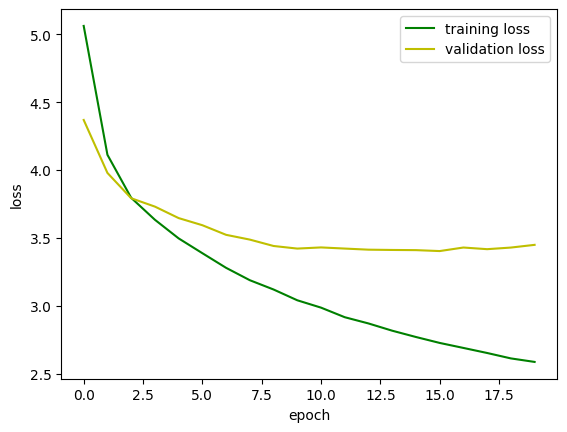

In [35]:
h = history.history
plt.plot(h['loss'],label="training loss",color = "g")
plt.plot(h['val_loss'],label="validation loss",color='y')
plt.xlabel("epoch")
plt.ylabel("loss")
plt.legend()
plt.show()

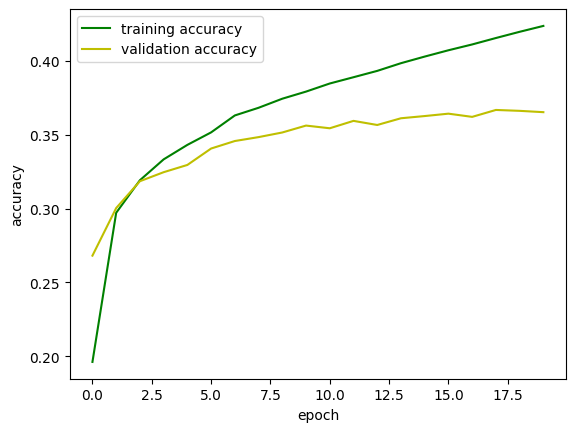

In [36]:
plt.plot(h['accuracy'],label="training accuracy",color = "g")
plt.plot(h['val_accuracy'],label="validation accuracy",color='y')
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend()
plt.show()

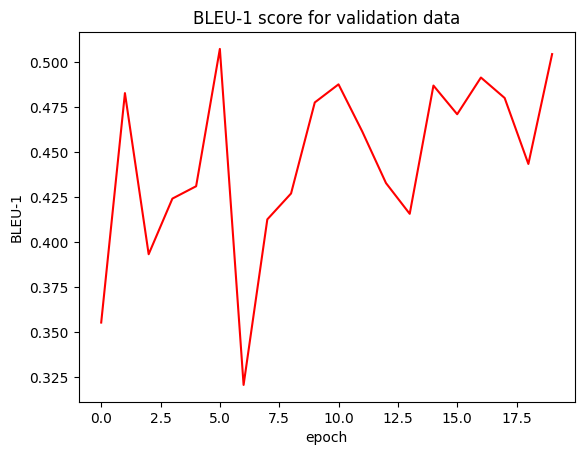

In [37]:
plt.plot(h["val_bleu_1"],label="validation BLEU-4",color='r')
plt.xlabel("epoch")
plt.ylabel("BLEU-1")
plt.title("BLEU-1 score for validation data")
plt.show()

In [38]:
predictions = []
for i in tqdm(range(0,len(test_features),100)):
    batch = test_features[i:i+100]
    sentences = ["ssttaarrtt"]*len(batch)
    for i in range(max_sentence_len):
        sequence = tokenizer.texts_to_sequences(sentences)
        sequence = pad_sequences(sequence,maxlen=max_sentence_len)
        yhat = model.predict((np.array(batch),sequence),verbose=0)
        yhat = np.argmax(yhat,axis=-1)
        word = [tokenizer.index_word[pred] for pred in yhat]
        sentences =[sentences[k]+" "+word[k] if word[k] is not None and word[k] !="eenndd" else sentences[k] for k in range(len(sentences))]
    predictions.extend(sentences)


reference = list(test_ref.values())
predection = [x.split() for x in predictions]
bleu_1 = corpus_bleu(reference,predection,weights=(1.0,0.0,0.0,0.0))
bleu_2 = corpus_bleu(reference,predection,weights=(0.5,0.5,0.0,0.0))
bleu_3 = corpus_bleu(reference,predection,weights=(0.3,0.3,0.3,0.0))
bleu_4 = corpus_bleu(reference,predection,weights=(0.25,0.25,0.25,0.25))


print(f"test set cumulative BLEU-1: {bleu_1}")
print(f"test set cumulative BLEU-2: {bleu_2}")
print(f"test set cumulative BLEU-3: {bleu_3}")
print(f"test set cumulative BLEU-4: {bleu_4}")


  0%|          | 0/10 [00:00<?, ?it/s]

test set cumulative BLEU-1: 0.5100255633820446
test set cumulative BLEU-2: 0.30335334248530094
test set cumulative BLEU-3: 0.21294985877013362
test set cumulative BLEU-4: 0.10464798998902407


In [40]:
#examples
example_predictions = []
batch = test_features[:20]
sentences = ["ssttaarrtt"]*len(batch)
for i in range(max_sentence_len):
    sequence = tokenizer.texts_to_sequences(sentences)
    sequence = pad_sequences(sequence,maxlen=max_sentence_len)
    yhat = model.predict((np.array(batch),sequence),verbose=0)
    yhat = np.argmax(yhat,axis=-1)
    word = [tokenizer.index_word[pred] for pred in yhat]
    sentences =[sentences[k]+" "+word[k] if word[k] is not None and word[k] !="eenndd" else sentences[k] for k in range(len(sentences))]
example_predictions.extend(sentences)

___________________actual captions___________________
ssttaarrtt four rugby players on the ground with two standing behind them eenndd
ssttaarrtt members of two soccer teams struggle on the field to get the ball eenndd
ssttaarrtt soccer players on the ground fighting for the ball eenndd
ssttaarrtt the rugby players in red are wrestling the player in yellow to the ground eenndd
ssttaarrtt three members of the red team are in the grass with member of the yellow team eenndd
___________________predicted captions___________________
ssttaarrtt two children are playing in the grass
___________________Image___________________


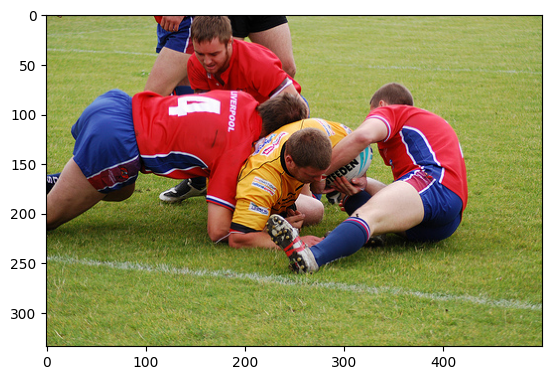

___________________actual captions___________________
ssttaarrtt girl with black dress and big white bow stands with her back to the camera eenndd
ssttaarrtt many people gather outside eenndd
ssttaarrtt people stand outside watching something eenndd
ssttaarrtt people with costumes are gathered in wooded area looking the same direction eenndd
ssttaarrtt the back of woman in costume little girl looks at her eenndd
___________________predicted captions___________________
ssttaarrtt two men are standing in front of an audience
___________________Image___________________


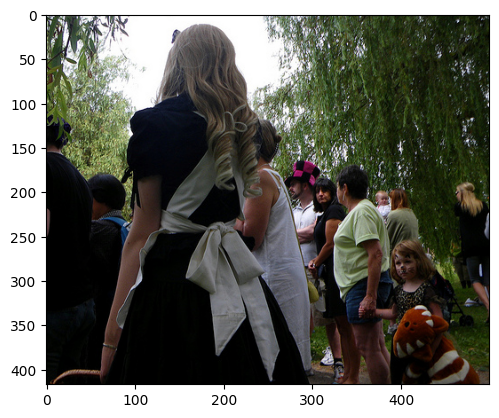

___________________actual captions___________________
ssttaarrtt brown and white dog is playing with toy in field of green grass and clover eenndd
ssttaarrtt brown and white dog retrieving white plushie toy in field of clover eenndd
ssttaarrtt distorted photo of playing dog in flower field eenndd
ssttaarrtt dog in grass carrying toy in its mouth eenndd
ssttaarrtt the little brown dog is running through clover field with white object in its mouth eenndd
___________________predicted captions___________________
ssttaarrtt dog is running through the grass
___________________Image___________________


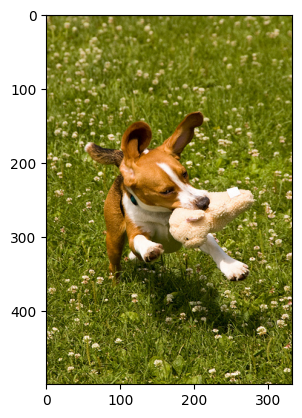

___________________actual captions___________________
ssttaarrtt jogger runs up brick stairs for streght training eenndd
ssttaarrtt man is skating down set of stairs eenndd
ssttaarrtt skateboarder jumps on brick stairs eenndd
ssttaarrtt young man skateboards around the empty outdoor sports arena eenndd
ssttaarrtt the man is skateboarding on large brick staircase eenndd
___________________predicted captions___________________
ssttaarrtt boy in red jacket is standing on the beach
___________________Image___________________


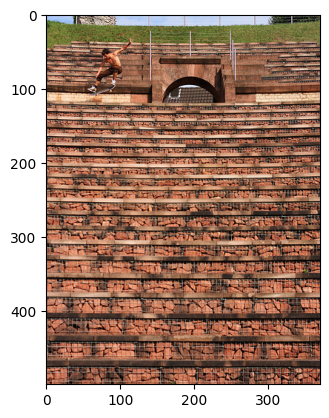

___________________actual captions___________________
ssttaarrtt boy falls off of his scooter during an obstacle course eenndd
ssttaarrtt boy wearing helmet flips up his scooter as he skates between orange cones eenndd
ssttaarrtt person wearing helmet begins to fall from silver scooter eenndd
ssttaarrtt woman is about to fall off scooter eenndd
ssttaarrtt this person is falling off scooter in parking lot eenndd
___________________predicted captions___________________
ssttaarrtt man in black jacket is standing on the sidewalk
___________________Image___________________


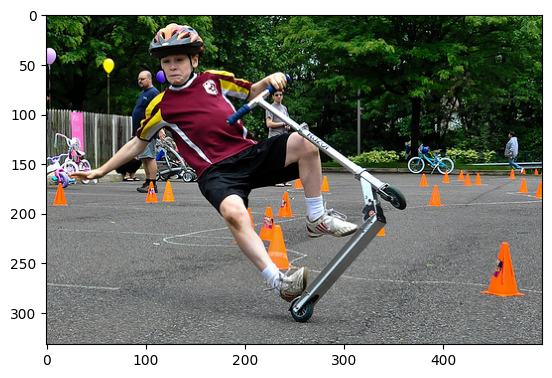

___________________actual captions___________________
ssttaarrtt woman in blue sweater with blue scarf around her head eenndd
ssttaarrtt woman in head covering is looking away from the camera eenndd
ssttaarrtt woman is wearing blue headscarf and blue sweater eenndd
ssttaarrtt woman wearing teal cardigan with teal scarf and sunglasses on her head eenndd
ssttaarrtt there is woman with green scarf around her head eenndd
___________________predicted captions___________________
ssttaarrtt young boy wearing red shirt is standing on the sidewalk
___________________Image___________________


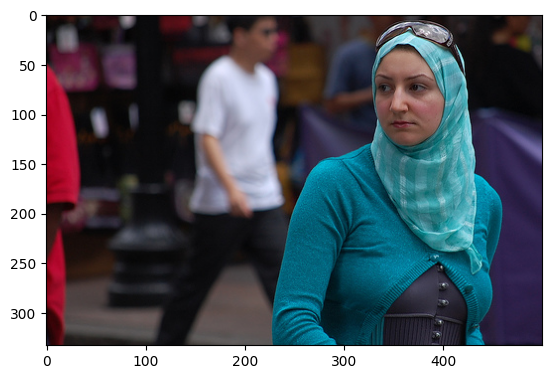

___________________actual captions___________________
ssttaarrtt pelican flies over the water eenndd
ssttaarrtt very large bird flying over water eenndd
ssttaarrtt white pelican is flying over the ocean eenndd
ssttaarrtt the white pelican is flying over the ocean eenndd
ssttaarrtt white gull flying over ocean eenndd
___________________predicted captions___________________
ssttaarrtt the dog is running through the water
___________________Image___________________


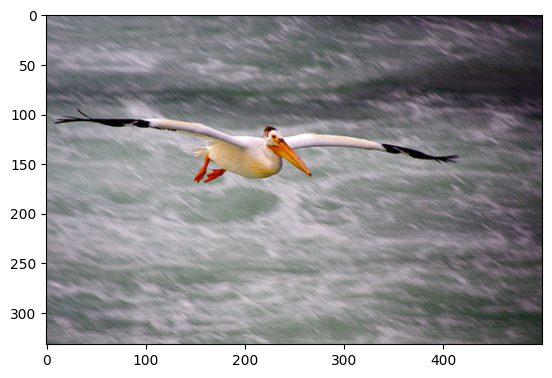

___________________actual captions___________________
ssttaarrtt person in red hat and shoes doing stunts on red bike while person in yellow watches eenndd
ssttaarrtt person is doing trick in the air on bike while his friend takes picture eenndd
ssttaarrtt red bike jumps toward person in yellow eenndd
ssttaarrtt boy in midair on bicycle eenndd
ssttaarrtt person doing bicycle jump eenndd
___________________predicted captions___________________
ssttaarrtt man in red jacket is standing on the sidewalk
___________________Image___________________


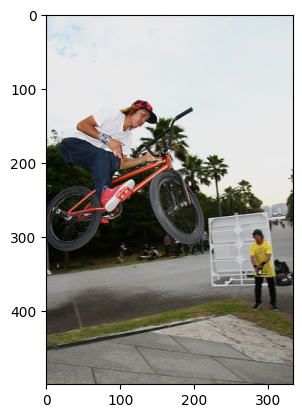

___________________actual captions___________________
ssttaarrtt small black dog is standing on two feet and wearing pink tutu eenndd
ssttaarrtt small dog in costume stands on hind legs to reach dangling flowers eenndd
ssttaarrtt the dog is jumping up beside red wall eenndd
ssttaarrtt the small brown and black down is wearing pink tutu eenndd
ssttaarrtt the small dog wearing tutu stands on its hind legs eenndd
___________________predicted captions___________________
ssttaarrtt dog is running through the grass
___________________Image___________________


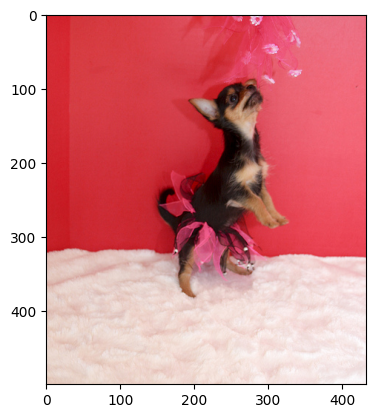

___________________actual captions___________________
ssttaarrtt man riding bike through the forest eenndd
ssttaarrtt mountain biker rides through shady trail eenndd
ssttaarrtt mountain biker travels along dirt trail inside heavily wooded area eenndd
ssttaarrtt person biking near trees eenndd
ssttaarrtt bicyclist in racing gear rides through forest area eenndd
___________________predicted captions___________________
ssttaarrtt man in red jacket is riding bike
___________________Image___________________


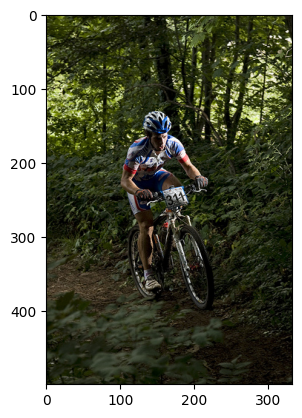

___________________actual captions___________________
ssttaarrtt there are two ladies embracing and posing shown here eenndd
ssttaarrtt two girlfriends smiling eenndd
ssttaarrtt two women have their arms around each other and are smiling eenndd
ssttaarrtt two women smile for the camera eenndd
ssttaarrtt two women with their arms around each other smile eenndd
___________________predicted captions___________________
ssttaarrtt man in red shirt is standing on the sidewalk
___________________Image___________________


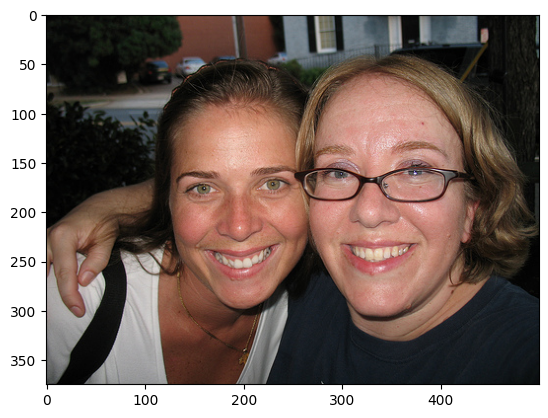

___________________actual captions___________________
ssttaarrtt closeup shot of three guys and girl posing for the camera eenndd
ssttaarrtt woman and three men are posing for photo eenndd
ssttaarrtt woman wearing glasses poses for the camera with three men eenndd
ssttaarrtt woman with her arms on the cheeks of two men on either side of her pose while another man peeks over her head eenndd
ssttaarrtt three men and woman posing for picture eenndd
___________________predicted captions___________________
ssttaarrtt two men are standing in front of an audience
___________________Image___________________


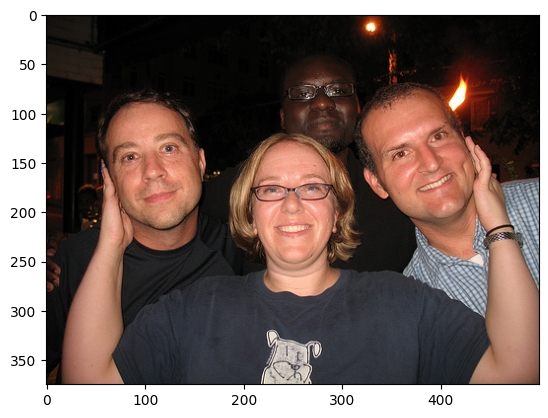

___________________actual captions___________________
ssttaarrtt woman and girl sitting on front lawn eenndd
ssttaarrtt woman and girl wearing traditional clothes sits on the front lawn reading from book eenndd
ssttaarrtt woman wearing colonial clothing is sitting on the grass reading to young girl eenndd
ssttaarrtt the girl and lady are sitting on blanket reading book eenndd
ssttaarrtt two women sitting on blanket on the lawn while sharing book eenndd
___________________predicted captions___________________
ssttaarrtt two children are playing in the snow
___________________Image___________________


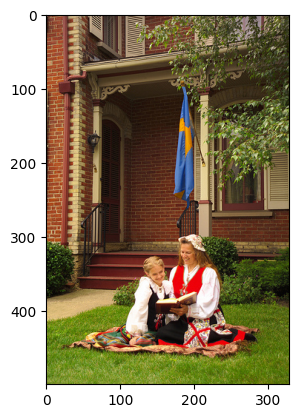

___________________actual captions___________________
ssttaarrtt boy and his bike leaps into the air eenndd
ssttaarrtt boy does tricks on bicycle while in park eenndd
ssttaarrtt boy doing trick on bike eenndd
ssttaarrtt boy is doing tricks on his bike as he flies in the air eenndd
ssttaarrtt this young biker has his arms out as he tries this trick eenndd
___________________predicted captions___________________
ssttaarrtt man in red jacket is riding bike on the street
___________________Image___________________


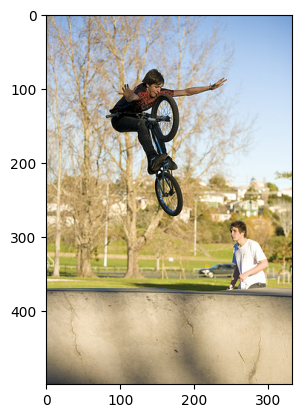

___________________actual captions___________________
ssttaarrtt red covered boat racing across the water eenndd
ssttaarrtt red high speed racing boat skips across the water eenndd
ssttaarrtt red speed boat crosses the water eenndd
ssttaarrtt watercraft speeds through the water eenndd
ssttaarrtt red boat marked graham races across water eenndd
___________________predicted captions___________________
ssttaarrtt man in red jacket is riding bike
___________________Image___________________


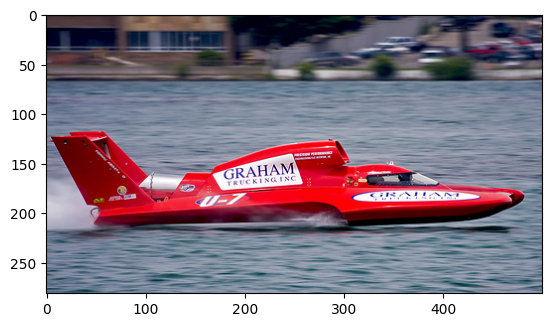

___________________actual captions___________________
ssttaarrtt man in pink shirt and white vest plays guitar eenndd
ssttaarrtt man in pink shirt playing guitar eenndd
ssttaarrtt man in white suit and pink shirt plays guitar eenndd
ssttaarrtt man wearing pants plays guitar while onstage eenndd
ssttaarrtt the man in the white and pink outfit is holding guitar eenndd
___________________predicted captions___________________
ssttaarrtt man in red shirt is standing on the sidewalk
___________________Image___________________


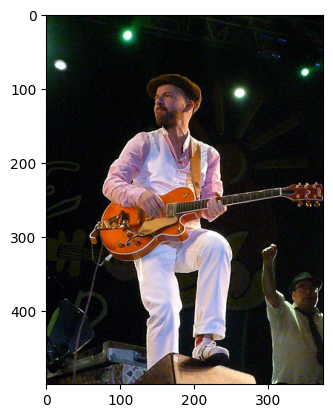

___________________actual captions___________________
ssttaarrtt greyhounds racing on track eenndd
ssttaarrtt greyhound race with the lead dog wearing yellow and black stripes and the number eenndd
ssttaarrtt dogs racing at track eenndd
ssttaarrtt greyhound dogs race on the track with leading the way eenndd
ssttaarrtt some greyhound dogs are racing on dirt track eenndd
___________________predicted captions___________________
ssttaarrtt two children are playing in the snow
___________________Image___________________


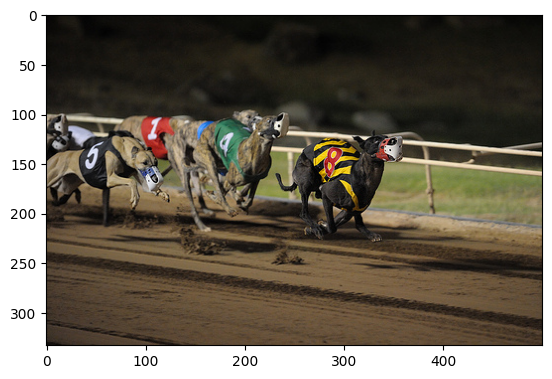

___________________actual captions___________________
ssttaarrtt bmx rider wall rides eenndd
ssttaarrtt man does trick with his bicycle off the side of wall eenndd
ssttaarrtt man jumps with his bike near brick wall eenndd
ssttaarrtt man is performing trick with bicycle off brick wall eenndd
ssttaarrtt the man rides his bicycle up the brick wall eenndd
___________________predicted captions___________________
ssttaarrtt man in red jacket is riding bike in the snow
___________________Image___________________


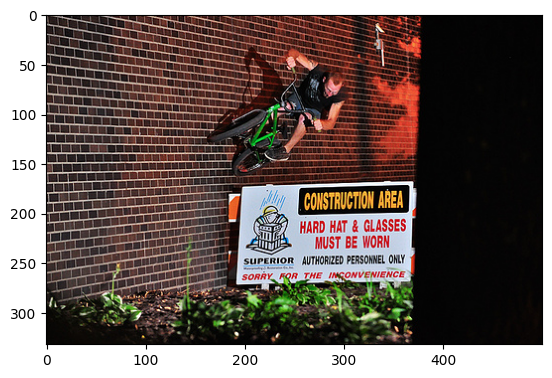

___________________actual captions___________________
ssttaarrtt group of young boys on opposing teams are playing soccer eenndd
ssttaarrtt children playing soccer near the goal net eenndd
ssttaarrtt four boys playing soccer eenndd
ssttaarrtt four children run along grassy field playing soccer eenndd
ssttaarrtt the young boy in the red shirt is kicking soccer ball eenndd
___________________predicted captions___________________
ssttaarrtt boy in red shirt is standing on the sidewalk
___________________Image___________________


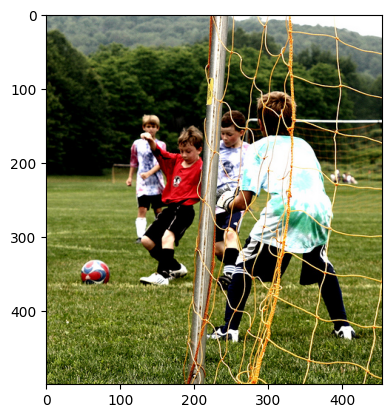

___________________actual captions___________________
ssttaarrtt bunch of little boys in bathing trunks running eenndd
ssttaarrtt two wet boys in swim trunks run eenndd
ssttaarrtt two young boys competing in race eenndd
ssttaarrtt two young boys in bathing suits walk eenndd
ssttaarrtt young boys running along the pavement eenndd
___________________predicted captions___________________
ssttaarrtt two children are playing in the snow
___________________Image___________________


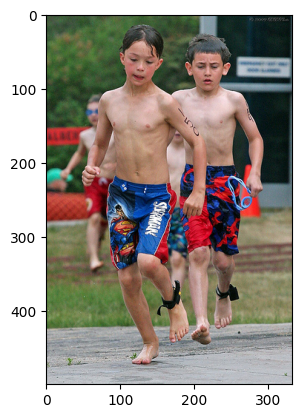

In [42]:
for i,image in enumerate(test_set["image"].unique().tolist()[:20]):
    img = load_img("/content/Images/"+image)
    print("___________________actual captions___________________")
    captions=test_set.loc[test_set["image"]==image]
    for caption in  captions["caption"].tolist():
        print(caption)
    print("___________________predicted captions___________________")
    print(example_predictions[i])
    print("___________________Image___________________")
    plt.imshow(img)
    plt.show()

In [43]:
# over fitting the model for more BLEU-1 score
history2 = model.fit(train_gen,steps_per_epoch=train_steps,validation_data=val_gen,validation_steps=val_steps,epochs=5,callbacks=[checkpoint,Bleu_callback])


Epoch 1/5
468/468 [==============================] - 92s 197ms/step - loss: 2.5451 - accuracy: 0.4276 - val_loss: 3.4725 - val_accuracy: 0.3658 - val_bleu_1: 0.4602
Epoch 2/5
468/468 [==============================] - 88s 189ms/step - loss: 2.5207 - accuracy: 0.4309 - val_loss: 3.4724 - val_accuracy: 0.3687 - val_bleu_1: 0.4811
Epoch 3/5
468/468 [==============================] - 90s 193ms/step - loss: 2.4859 - accuracy: 0.4352 - val_loss: 3.4688 - val_accuracy: 0.3673 - val_bleu_1: 0.4471
Epoch 4/5
468/468 [==============================] - 91s 195ms/step - loss: 2.4641 - accuracy: 0.4378 - val_loss: 3.4982 - val_accuracy: 0.3678 - val_bleu_1: 0.4987
Epoch 5/5
468/468 [==============================] - 96s 204ms/step - loss: 2.4339 - accuracy: 0.4418 - val_loss: 3.4644 - val_accuracy: 0.3715 - val_bleu_1: 0.4897


In [44]:
#examples
example_predictions = []
batch = test_features[:20]
sentences = ["ssttaarrtt"]*len(batch)
for i in range(max_sentence_len):
    sequence = tokenizer.texts_to_sequences(sentences)
    sequence = pad_sequences(sequence,maxlen=max_sentence_len)
    yhat = model.predict((np.array(batch),sequence),verbose=0)
    yhat = np.argmax(yhat,axis=-1)
    word = [tokenizer.index_word[pred] for pred in yhat]
    sentences =[sentences[k]+" "+word[k] if word[k] is not None and word[k] !="eenndd" else sentences[k] for k in range(len(sentences))]
example_predictions.extend(sentences)

___________________actual captions___________________
ssttaarrtt four rugby players on the ground with two standing behind them eenndd
ssttaarrtt members of two soccer teams struggle on the field to get the ball eenndd
ssttaarrtt soccer players on the ground fighting for the ball eenndd
ssttaarrtt the rugby players in red are wrestling the player in yellow to the ground eenndd
ssttaarrtt three members of the red team are in the grass with member of the yellow team eenndd
___________________predicted captions___________________
ssttaarrtt two men are playing soccer
___________________Image___________________


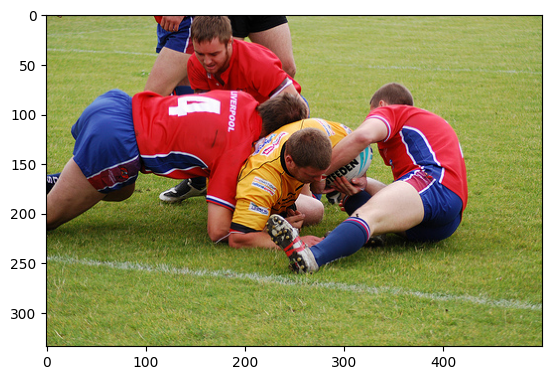

___________________actual captions___________________
ssttaarrtt girl with black dress and big white bow stands with her back to the camera eenndd
ssttaarrtt many people gather outside eenndd
ssttaarrtt people stand outside watching something eenndd
ssttaarrtt people with costumes are gathered in wooded area looking the same direction eenndd
ssttaarrtt the back of woman in costume little girl looks at her eenndd
___________________predicted captions___________________
ssttaarrtt group of people are standing in front of large tree
___________________Image___________________


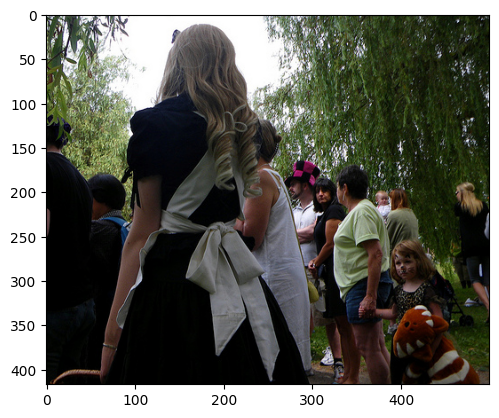

___________________actual captions___________________
ssttaarrtt brown and white dog is playing with toy in field of green grass and clover eenndd
ssttaarrtt brown and white dog retrieving white plushie toy in field of clover eenndd
ssttaarrtt distorted photo of playing dog in flower field eenndd
ssttaarrtt dog in grass carrying toy in its mouth eenndd
ssttaarrtt the little brown dog is running through clover field with white object in its mouth eenndd
___________________predicted captions___________________
ssttaarrtt black dog is running on the grass
___________________Image___________________


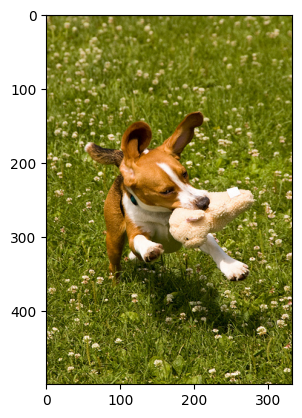

___________________actual captions___________________
ssttaarrtt jogger runs up brick stairs for streght training eenndd
ssttaarrtt man is skating down set of stairs eenndd
ssttaarrtt skateboarder jumps on brick stairs eenndd
ssttaarrtt young man skateboards around the empty outdoor sports arena eenndd
ssttaarrtt the man is skateboarding on large brick staircase eenndd
___________________predicted captions___________________
ssttaarrtt man in blue shirt is riding bike on the beach
___________________Image___________________


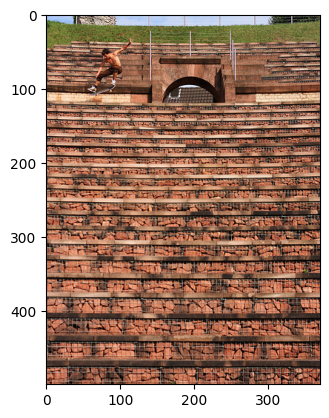

___________________actual captions___________________
ssttaarrtt boy falls off of his scooter during an obstacle course eenndd
ssttaarrtt boy wearing helmet flips up his scooter as he skates between orange cones eenndd
ssttaarrtt person wearing helmet begins to fall from silver scooter eenndd
ssttaarrtt woman is about to fall off scooter eenndd
ssttaarrtt this person is falling off scooter in parking lot eenndd
___________________predicted captions___________________
ssttaarrtt man in blue shirt is riding bike on the street
___________________Image___________________


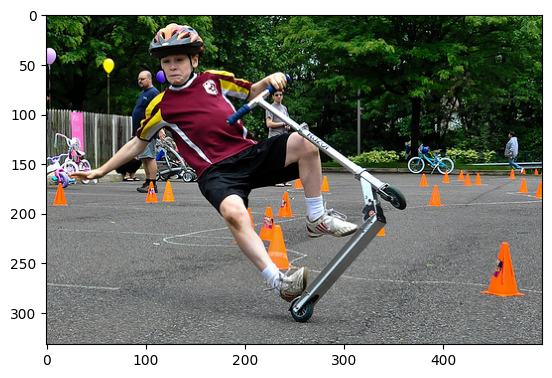

___________________actual captions___________________
ssttaarrtt woman in blue sweater with blue scarf around her head eenndd
ssttaarrtt woman in head covering is looking away from the camera eenndd
ssttaarrtt woman is wearing blue headscarf and blue sweater eenndd
ssttaarrtt woman wearing teal cardigan with teal scarf and sunglasses on her head eenndd
ssttaarrtt there is woman with green scarf around her head eenndd
___________________predicted captions___________________
ssttaarrtt man in black shirt and black pants is holding an object while another man looks on
___________________Image___________________


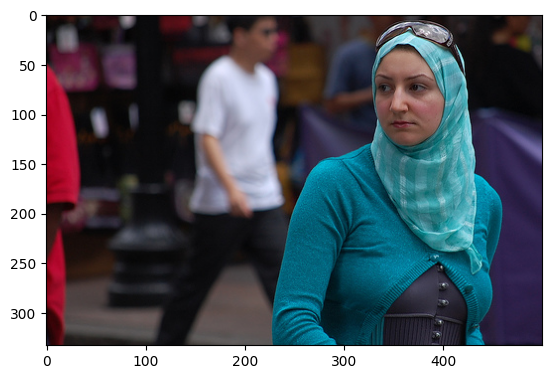

___________________actual captions___________________
ssttaarrtt pelican flies over the water eenndd
ssttaarrtt very large bird flying over water eenndd
ssttaarrtt white pelican is flying over the ocean eenndd
ssttaarrtt the white pelican is flying over the ocean eenndd
ssttaarrtt white gull flying over ocean eenndd
___________________predicted captions___________________
ssttaarrtt dog jumps over hurdle
___________________Image___________________


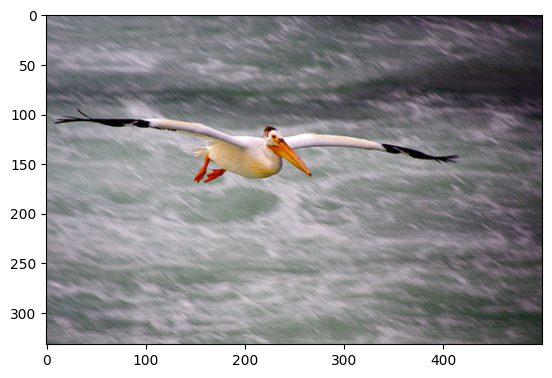

___________________actual captions___________________
ssttaarrtt person in red hat and shoes doing stunts on red bike while person in yellow watches eenndd
ssttaarrtt person is doing trick in the air on bike while his friend takes picture eenndd
ssttaarrtt red bike jumps toward person in yellow eenndd
ssttaarrtt boy in midair on bicycle eenndd
ssttaarrtt person doing bicycle jump eenndd
___________________predicted captions___________________
ssttaarrtt man in blue shirt is riding bike on the street
___________________Image___________________


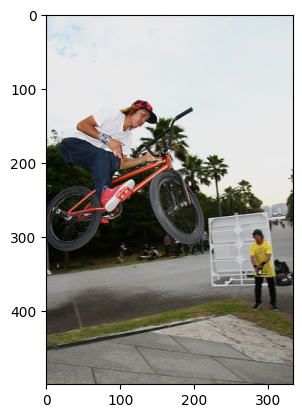

___________________actual captions___________________
ssttaarrtt small black dog is standing on two feet and wearing pink tutu eenndd
ssttaarrtt small dog in costume stands on hind legs to reach dangling flowers eenndd
ssttaarrtt the dog is jumping up beside red wall eenndd
ssttaarrtt the small brown and black down is wearing pink tutu eenndd
ssttaarrtt the small dog wearing tutu stands on its hind legs eenndd
___________________predicted captions___________________
ssttaarrtt black dog is running on the grass
___________________Image___________________


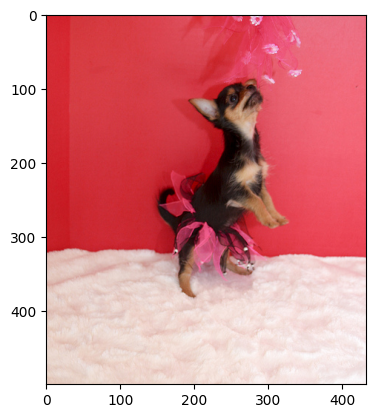

___________________actual captions___________________
ssttaarrtt man riding bike through the forest eenndd
ssttaarrtt mountain biker rides through shady trail eenndd
ssttaarrtt mountain biker travels along dirt trail inside heavily wooded area eenndd
ssttaarrtt person biking near trees eenndd
ssttaarrtt bicyclist in racing gear rides through forest area eenndd
___________________predicted captions___________________
ssttaarrtt man in blue jacket and black pants is jumping over tree stump
___________________Image___________________


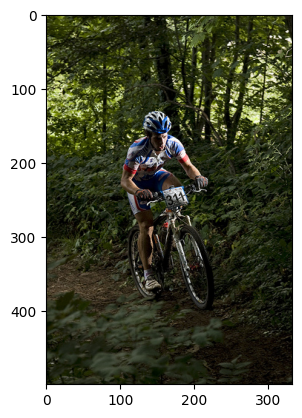

___________________actual captions___________________
ssttaarrtt there are two ladies embracing and posing shown here eenndd
ssttaarrtt two girlfriends smiling eenndd
ssttaarrtt two women have their arms around each other and are smiling eenndd
ssttaarrtt two women smile for the camera eenndd
ssttaarrtt two women with their arms around each other smile eenndd
___________________predicted captions___________________
ssttaarrtt two men are standing in front of large building
___________________Image___________________


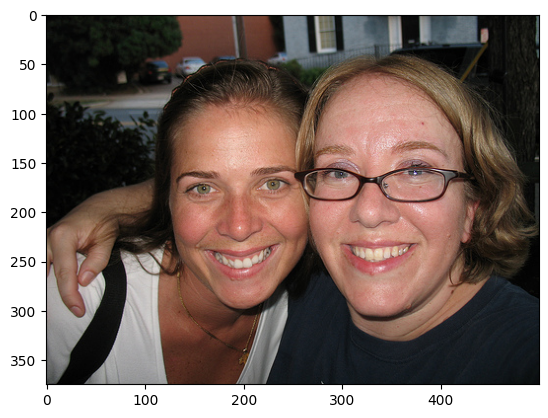

___________________actual captions___________________
ssttaarrtt closeup shot of three guys and girl posing for the camera eenndd
ssttaarrtt woman and three men are posing for photo eenndd
ssttaarrtt woman wearing glasses poses for the camera with three men eenndd
ssttaarrtt woman with her arms on the cheeks of two men on either side of her pose while another man peeks over her head eenndd
ssttaarrtt three men and woman posing for picture eenndd
___________________predicted captions___________________
ssttaarrtt group of people are gathered around mosque
___________________Image___________________


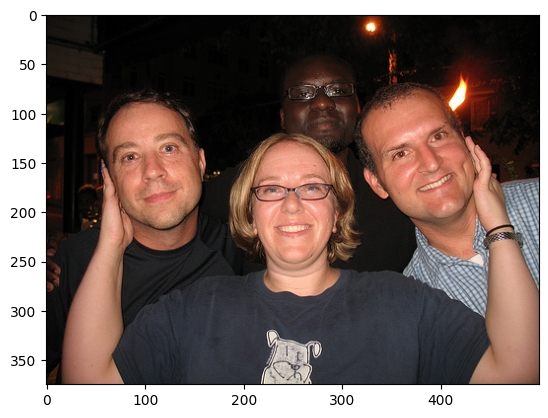

___________________actual captions___________________
ssttaarrtt woman and girl sitting on front lawn eenndd
ssttaarrtt woman and girl wearing traditional clothes sits on the front lawn reading from book eenndd
ssttaarrtt woman wearing colonial clothing is sitting on the grass reading to young girl eenndd
ssttaarrtt the girl and lady are sitting on blanket reading book eenndd
ssttaarrtt two women sitting on blanket on the lawn while sharing book eenndd
___________________predicted captions___________________
ssttaarrtt two men are playing in the park
___________________Image___________________


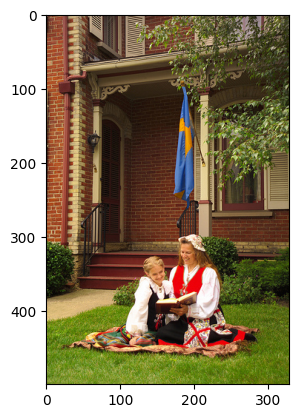

___________________actual captions___________________
ssttaarrtt boy and his bike leaps into the air eenndd
ssttaarrtt boy does tricks on bicycle while in park eenndd
ssttaarrtt boy doing trick on bike eenndd
ssttaarrtt boy is doing tricks on his bike as he flies in the air eenndd
ssttaarrtt this young biker has his arms out as he tries this trick eenndd
___________________predicted captions___________________
ssttaarrtt man in blue shirt is jumping on the railing of the road
___________________Image___________________


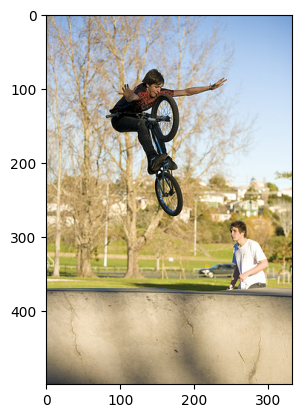

___________________actual captions___________________
ssttaarrtt red covered boat racing across the water eenndd
ssttaarrtt red high speed racing boat skips across the water eenndd
ssttaarrtt red speed boat crosses the water eenndd
ssttaarrtt watercraft speeds through the water eenndd
ssttaarrtt red boat marked graham races across water eenndd
___________________predicted captions___________________
ssttaarrtt man in blue jacket and helmet is riding bike through the woods
___________________Image___________________


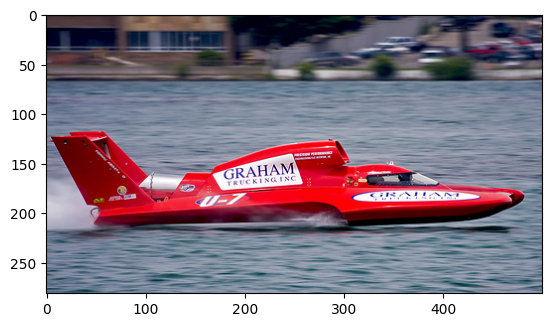

___________________actual captions___________________
ssttaarrtt man in pink shirt and white vest plays guitar eenndd
ssttaarrtt man in pink shirt playing guitar eenndd
ssttaarrtt man in white suit and pink shirt plays guitar eenndd
ssttaarrtt man wearing pants plays guitar while onstage eenndd
ssttaarrtt the man in the white and pink outfit is holding guitar eenndd
___________________predicted captions___________________
ssttaarrtt man in blue shirt is standing in front of an audience
___________________Image___________________


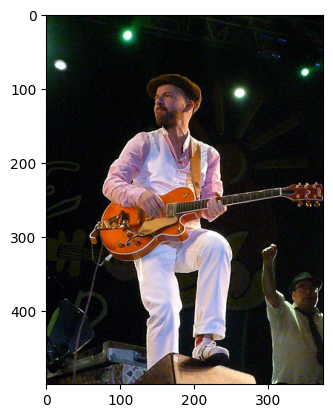

___________________actual captions___________________
ssttaarrtt greyhounds racing on track eenndd
ssttaarrtt greyhound race with the lead dog wearing yellow and black stripes and the number eenndd
ssttaarrtt dogs racing at track eenndd
ssttaarrtt greyhound dogs race on the track with leading the way eenndd
ssttaarrtt some greyhound dogs are racing on dirt track eenndd
___________________predicted captions___________________
ssttaarrtt two dogs are playing in the snow
___________________Image___________________


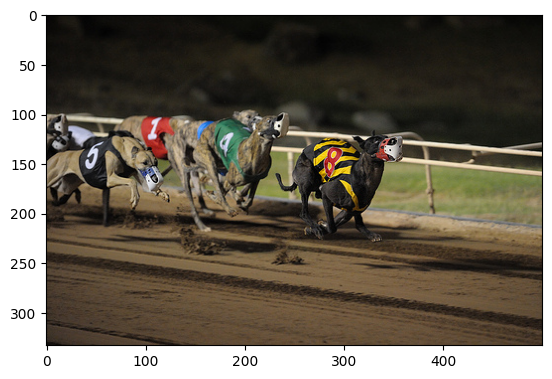

___________________actual captions___________________
ssttaarrtt bmx rider wall rides eenndd
ssttaarrtt man does trick with his bicycle off the side of wall eenndd
ssttaarrtt man jumps with his bike near brick wall eenndd
ssttaarrtt man is performing trick with bicycle off brick wall eenndd
ssttaarrtt the man rides his bicycle up the brick wall eenndd
___________________predicted captions___________________
ssttaarrtt man in blue shirt is riding bike on the street
___________________Image___________________


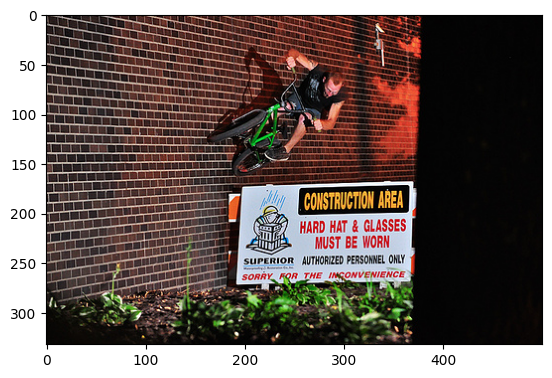

___________________actual captions___________________
ssttaarrtt group of young boys on opposing teams are playing soccer eenndd
ssttaarrtt children playing soccer near the goal net eenndd
ssttaarrtt four boys playing soccer eenndd
ssttaarrtt four children run along grassy field playing soccer eenndd
ssttaarrtt the young boy in the red shirt is kicking soccer ball eenndd
___________________predicted captions___________________
ssttaarrtt the girl is playing soccer
___________________Image___________________


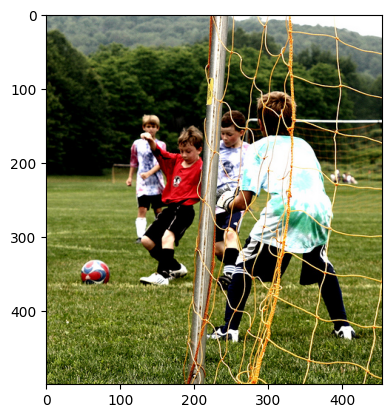

___________________actual captions___________________
ssttaarrtt bunch of little boys in bathing trunks running eenndd
ssttaarrtt two wet boys in swim trunks run eenndd
ssttaarrtt two young boys competing in race eenndd
ssttaarrtt two young boys in bathing suits walk eenndd
ssttaarrtt young boys running along the pavement eenndd
___________________predicted captions___________________
ssttaarrtt two young boys are playing in the snow
___________________Image___________________


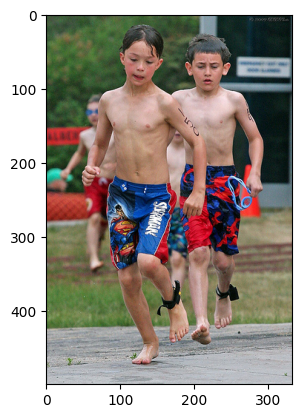

In [45]:
for i,image in enumerate(test_set["image"].unique().tolist()[:20]):
    img = load_img("/content/Images/"+image)
    print("___________________actual captions___________________")
    captions=test_set.loc[test_set["image"]==image]
    for caption in  captions["caption"].tolist():
        print(caption)
    print("___________________predicted captions___________________")
    print(example_predictions[i])
    print("___________________Image___________________")
    plt.imshow(img)
    plt.show()